<a href="https://colab.research.google.com/github/edouardor/piano-roll-midi/blob/main/piano_roll_midi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
!pip install pretty_midi

     |████████████████████████████████| 5.6MB 8.5MB/s 
     |████████████████████████████████| 61kB 8.4MB/s 
  Created wheel for pretty-midi: filename=pretty_midi-0.2.9-cp36-none-any.whl size=5591954 sha256=714f8a6b8a55b6d8ef603938e1dfc89e33f757859baf7fcd09d7021353ca07d8
  Stored in directory: /root/.cache/pip/wheels/4c/a1/c6/b5697841db1112c6e5866d75a6b6bf1bef73b874782556ba66
Successfully built pretty-midi


In [6]:
!pip install mir_eval

     |████████████████████████████████| 92kB 4.0MB/s 
  Created wheel for mir-eval: filename=mir_eval-0.6-cp36-none-any.whl size=96515 sha256=550af8ad42611031e4b7448f16596eb5f6cb3daedf0502e04d3cae92e1663c46
  Stored in directory: /root/.cache/pip/wheels/49/ce/30/730fa72addf275e49d90683b01b3613048b4be3bf7ff8eb6ec
Successfully built mir-eval


In [ ]:
!pip install librosa 

In [ ]:
!pip install pyfluidsynth

In [46]:
!pip install ffmpeg

  Created wheel for ffmpeg: filename=ffmpeg-1.4-cp36-none-any.whl size=6083 sha256=a98ec530b25a74f727e6c7cdc9e251cebad744417a6a0c6650b392e19e6ab1ac
  Stored in directory: /root/.cache/pip/wheels/b6/68/c3/a05a35f647ba871e5572b9bbfc0b95fd1c6637a2219f959e7a
Successfully built ffmpeg


## pretty_midi tutorial
This tutorial goes over the functionality of pretty_midi, a Python library for creating, manipulating, and extracting information from MIDI files. For more information, check the docs.

from https://github.com/craffel/pretty-midi/blob/master/Tutorial.ipynb

In [7]:
# For Python2.6 compatibility
from __future__ import print_function

import pretty_midi
import numpy as np
# For plotting
import mir_eval.display
import librosa.display
import matplotlib.pyplot as plt
%matplotlib inline
# For putting audio in the notebook
import IPython.display

In [ ]:
import fluidsynth

ImportError: ignored

In [8]:
# Construct a PrettyMIDI object.
# We'll specify that it will have a tempo of 80bpm.
pm = pretty_midi.PrettyMIDI(initial_tempo=80)

In [ ]:
# The instruments list from our PrettyMIDI instance starts empty
print(pm.instruments)

[]


In [ ]:
# Let's add a Cello instrument, which has program number 42.
# pretty_midi also keeps track of whether each instrument is a "drum" instrument or not
# because drum/non-drum instruments share program numbers in MIDI.
# You can also optionally give the instrument a name,
# which corresponds to the MIDI "instrument name" meta-event.
inst = pretty_midi.Instrument(program=42, is_drum=False, name='my cello')
pm.instruments.append(inst)

## Event containers
pretty_midi has individual classes for holding MIDI events: Note, PitchBend, and ControlChange. These classes store information analogous to their corresponding MIDI events. The Instrument class has separate lists for each of these event types.

Note
The Note class represents a MIDI note, which has a pitch, a start time, and and end time. Notes have a pitch number from 0 to 127, representing the notes from C-1 to G9. In addition, notes have a velocity (volume) from 1 to 127, from quietest to loudest. The way pretty_midi stores notes is slightly different from standard MIDI, in the sense that in MIDI the note-on and note-off events are separate and their correspondences must be guessed from the MIDI stream. pretty_midi keeps the start and end times of a note coupled together, so things are less ambiguous. Furthermore, pretty_midi stores all times in terms of actual wall clock time from the start of the MIDI sequence, rather than in "ticks" (discussed further below). This is much easier to work with!

In [ ]:

# Let's add a few notes to our instrument
velocity = 100
for pitch, start, end in zip([60, 62, 64], [0.2, 0.6, 1.0], [1.1, 1.7, 2.3]):
    inst.notes.append(pretty_midi.Note(velocity, pitch, start, end))
print(inst.notes)

[Note(start=0.200000, end=1.100000, pitch=60, velocity=100), Note(start=0.600000, end=1.700000, pitch=62, velocity=100), Note(start=1.000000, end=2.300000, pitch=64, velocity=100)]


###Pitch bends

Since MIDI notes are all defined to have a specific integer pitch value, in order to represent arbitrary pitch frequencies we need to use pitch bends. A PitchBend class in pretty_midi holds a time (in seconds) and a pitch offset. The pitch offset is an integer in the range [-8192, 8191], which in General MIDI spans the range from -2 to +2 semitones. As with Notes, the Instrument class has a list for PitchBend class instances.

In [ ]:
# We'll just do a 1-semitone pitch ramp up
n_steps = 512
bend_range = 8192//2
for time, pitch in zip(np.linspace(1.5, 2.3, n_steps),
                       range(0, bend_range, bend_range//n_steps)):
    inst.pitch_bends.append(pretty_midi.PitchBend(pitch, time))

###Plotting a piano roll

A great way to visualize MIDI data is via a piano roll, which is a time-frequency matrix where each row is a different MIDI pitch and each column is a different slice in time. pretty_midi can produce piano roll matrices for each indivual instrument (via Instrument.get_piano_roll) or the entire PrettyMIDI object (summed across instruments, via PrettyMIDI.get_piano_roll). The spacing in time between subsequent columns of the matrix is determined by the fs parameter.

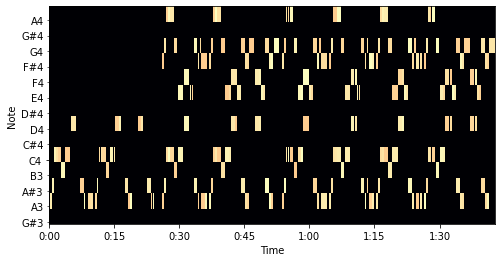

In [12]:
def plot_piano_roll(pm, start_pitch, end_pitch, fs=100):
    # Use librosa's specshow function for displaying the piano roll
    librosa.display.specshow(pm.get_piano_roll(fs)[start_pitch:end_pitch],
                             hop_length=1, sr=fs, x_axis='time', y_axis='cqt_note',
                             fmin=pretty_midi.note_number_to_hz(start_pitch))

plt.figure(figsize=(8, 4))
plot_piano_roll(pm, 56, 70)
# Note the blurry section between 1.5s and 2.3s - that's the pitch bending up!

###Sonification

pretty_midi has two main ways to sonify MIDI data: the synthesize and fluidsynth functions. synthesize is a simple and rudimentary method which just synthesizes each note as a sine wave. fluidsynth uses the Fluidsynth program along with a SoundFont file (a simple one is installed alongside pretty_midi) to create a General MIDI synthesis. Note that you must have the Fluidsynth program installed to use the fluidsynth function. Both the Instrument and PrettyMIDI classes have these methods; the PrettyMIDI versions just sum up the syntheses for all of the contained instruments.

In [18]:
# Synthesis frequency
fs = 16000
IPython.display.Audio(pm.synthesize(fs=16000), rate=16000)
# Sounds like sine waves..

In [ ]:
IPython.display.Audio(pm.fluidsynth(fs=16000), rate=16000)
# Sounds (kind of) like a cello!

ImportError: ignored

###Writing it out

Finally, we can easily write out what we just made to a standard MIDI file via the write function. pretty_midi puts each Instrument on a separate track in the MIDI file. Note that because pretty_midi uses a slightly different representation of MIDI data (for example, representing time as absolute seconds rather than as ticks), the information written out to the file will be slightly different. Otherwise, everything in your PrettyMIDI object will be included in the generated MIDI file.

In [ ]:
pm.write('out.mid')

## Parsing a MIDI file

The other intended use of pretty_midi is to parse MIDI files, so that they can be manipulated and analyzed. Loading in a MIDI file is simple. pretty_midi should be able to handle all valid MIDI files, and will raise an Exception of the MIDI data is corrupt.

In [1]:
from google.colab import files
src = list(files.upload().values())[0]
print(src)

Saving Copy of CAT00370 CORO (1).mid to Copy of CAT00370 CORO (1).mid
b'MThd\x00\x00\x00\x06\x00\x01\x00\x04\x00\xf0MTrk\x00\x00\x006\x00\xffX\x04\x03\x010\x08\x00\xffQ\x03\x03E\x0e\x81\xe1\x00\xffQ\x03\x03w\xc9\x81\xb4\x00\xffQ\x03\x03\xa9\x80\xad\x00\xffQ\x03\x03w\xc9\x82\xbb\x00\xffQ\x03\x03\xa9\x80\x00\xff/\x00MTrk\x00\x00\x04o\x00\xff\x03\x03S/A\x00\xc0H\x00\xb0\x07V\x00\xb0\n@\x00\xb0[ \x00\xc0H\x00\xb0\x07V\x00\xb0\n@\x00\xb0[ \x00\xc0H\x00\xb0\x07V\x00\xb0\n@\x00\xb0[ \x00\xc0H\x00\xb0\x07V\x00\xb0\n@\x00\xb0[ \x00\xc0H\x00\xb0\x07V\x00\xb0\n@\x00\xb0[ \x00\xc0H\x00\xb0\x07V\x00\xb0\n@\x00\xb0[ \x00\xc0H\x00\xb0\x07V\x00\xb0\n@\x00\xb0[ \x00\xc0H\x00\xb0\x07V\x00\xb0\n@\x00\xb0[ \x81\xe4`\x90BK\x830\x80B@0\x90CP\x830\x80C@0\x90EL\x830\x80E@0\x90ES\x830\x80E@0\x90EP\x87\x10\x80E@0\x90CN\x86`\x80C@`\x90@S\x8a\x10\x80@@\x81\x10\x90AS\x8a\x10\x80A@\x81\x10\x90@R\x830\x80@@0\x90@L\x830\x80@@0\x90CS\x87\x10\x80C@0\x90BP\x830\x80B@0\x90CN\x830\x80C@0\x90BK\x86`\x80B@`\x90BK\x830\x80B@

In [10]:
# We'll load in the example.mid file distributed with pretty_midi
pm = pretty_midi.PrettyMIDI('Copy of CAT00370 CORO (1).mid')

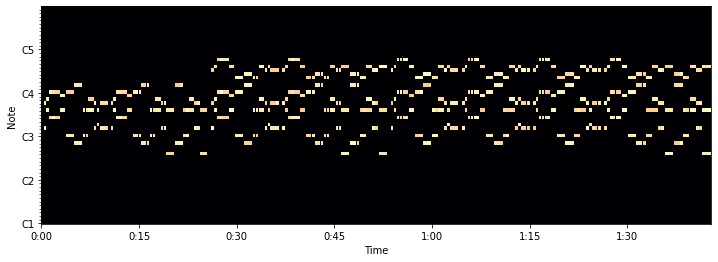

In [13]:
plt.figure(figsize=(12, 4))
plot_piano_roll(pm, 24, 84)

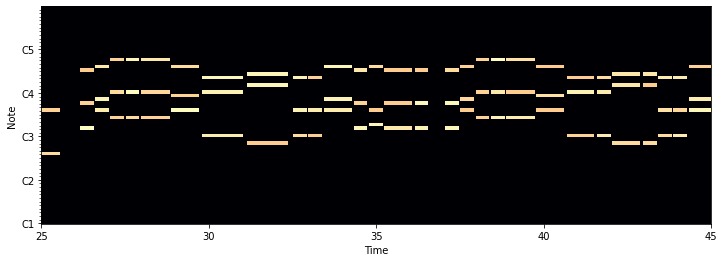

In [26]:
# Get and downbeat times
beats = pm.get_beats()
downbeats = pm.get_downbeats()
# Plot piano roll
fig = plt.figure(figsize=(12, 4))
plot_piano_roll(pm, 24, 84)
ymin, ymax = plt.ylim()
# Plot beats as grey lines, downbeats as white lines
#mir_eval.display.events(beats, base=ymin, height=ymax, color='#AAAAAA')
#mir_eval.display.events(downbeats, base=ymin, height=ymax, color='#FFFFFF', lw=2)
# Only display 20 seconds for clarity
plt.xlim(25, 45);


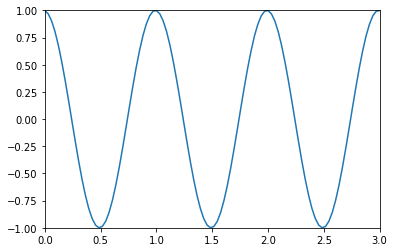

In [59]:

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
plt.rcParams["animation.html"] = "jshtml"
k = 2*np.pi
w = 2*np.pi
dt = 0.01

xmin = 0
xmax = 3
nbx = 100

x = np.linspace(xmin, xmax, nbx)

fig = plt.figure() # initialise la figure
line, = plt.plot([],[]) 
plt.xlim(xmin, xmax)
plt.ylim(-1,1)

# fonction à définir quand blit=True
# crée l'arrière de l'animation qui sera présent sur chaque image
def init():
    line.set_data([],[])
    return line,

def animate(i): 
    t = i * dt
    y = np.cos(k*x - w*t)
    line.set_data(x, y)
    return line,
 
ani = animation.FuncAnimation(fig, animate, init_func=init, frames=100, blit=True, interval=20, repeat=False)



In [25]:
%matplotlib inline

import numpy as np
from matplotlib import pyplot as plt
from IPython.display import clear_output
from time import sleep

n = 10
a = np.zeros((n, n))
plt.figure()

for i in range(n):
    plt.imshow(a)
    plt.show()
    a[i, i] = 1
    sleep(0.1)
    clear_output(wait=True)

'for i in range(n):\n    plt.imshow(a)\n    plt.show()\n    a[i, i] = 1\n    sleep(0.1)\n    clear_output(wait=True)'

<Figure size 432x288 with 0 Axes>

In [53]:

from IPython.display import clear_output
from time import sleep


n = 50
for i in range(n):
    fig = plt.figure(figsize=(12, 4))
    plot_piano_roll(pm, 24, 84)
    
    
    plt.xlim(25+i/10, 35+i/10);
    plt.show()

    sleep(0.05)
    clear_output(wait=True)



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

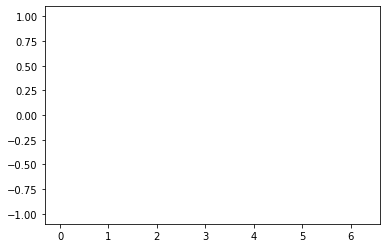

In [61]:
%matplotlib inline
#import matplotlib.pyplot as plt
plt.rcParams["animation.html"] = "jshtml"
import matplotlib.animation
import numpy as np

t = np.linspace(0,2*np.pi)
x = np.sin(t)

fig, ax = plt.subplots()
l, = ax.plot([0,2*np.pi],[-1,1])

animate = lambda i: l.set_data(t[:i], x[:i])

ani = matplotlib.animation.FuncAnimation(fig, animate, frames=len(t))
ani

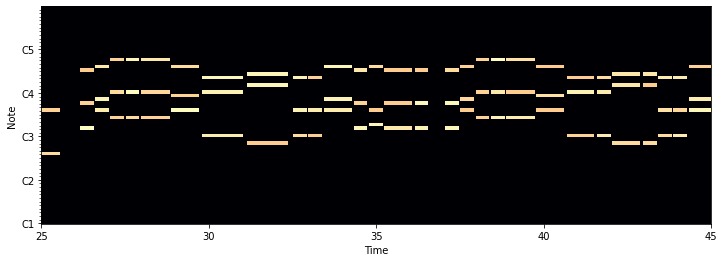

In [68]:
%matplotlib inline
#import matplotlib.pyplot as plt
plt.rcParams["animation.html"] = "jshtml"
import matplotlib.animation
fig = plt.figure(figsize=(12, 4))
plot_piano_roll(pm, 24, 84)
def animate(i): 
    return plt.xlim(25+i/20, 45+i/20);
ani = matplotlib.animation.FuncAnimation(fig, animate, frames=20)
ani

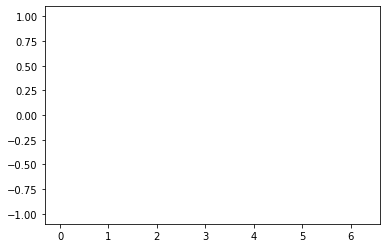

In [72]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams["animation.html"] = "html5"
import matplotlib.animation
import numpy as np

t = np.linspace(0,2*np.pi)
x = np.sin(t)

fig, ax = plt.subplots()
l, = ax.plot([0,2*np.pi],[-1,1])

animate = lambda i: l.set_data(t[:i], x[:i])

ani = matplotlib.animation.FuncAnimation(fig, animate, frames=len(t))
ani

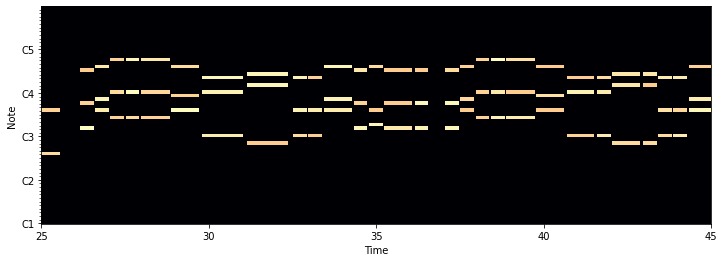

In [74]:
%matplotlib inline
#import matplotlib.pyplot as plt
plt.rcParams["animation.html"] = "html5"
import matplotlib.animation
fig = plt.figure(figsize=(12, 4))
plot_piano_roll(pm, 24, 84)
def animate(i): 
    return plt.xlim(25+i/20, 45+i/20);
ani = matplotlib.animation.FuncAnimation(fig, animate, frames=50)
ani